# End-to-end Multi-class Dog breed Classification

This notebook builds an end to end multi class image classifier using TnsorFlow2.0 and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data we are using is from Kaggle's breed identification competition.
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with probabilities for each dog breed of test image.

## 4. Features
Some information about the data:
* are dealing with images (unstructured data) so its probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels)
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [84]:
# #mounting Drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [1]:
#unzipping the folder
!unzip "/content/drive/MyDrive/Machine Learning /dog vision/dog-breed-identification.zip"

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

### Get our workspace ready
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we are using a GPU

In [2]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ",tf.__version__)
print("TF Hub version: ",hub.__version__)

#Check for GPU availability
print("GPU","available :)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version:  2.18.0
TF Hub version:  0.16.1
GPU not available :(


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning images into tensors(numerical representation).

Lets start by accesing our data and checking out labels.

In [3]:
import pandas as pd
labels_csv=pd.read_csv("/content/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

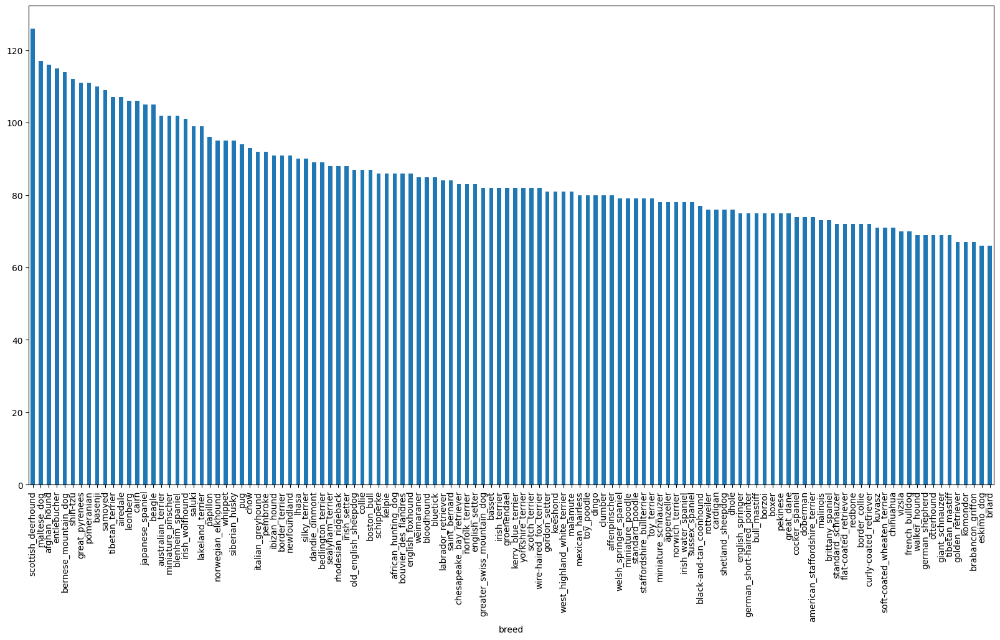

In [5]:
#how many images are there of each breed
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

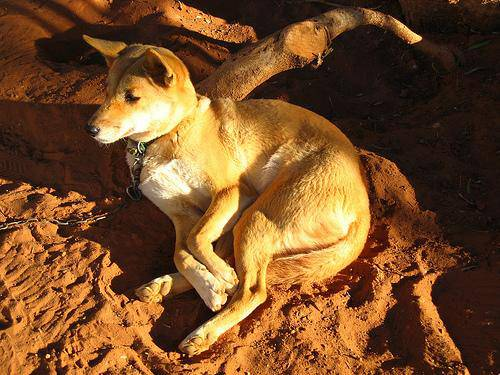

In [7]:
#lets view an image
from IPython.display import Image
Image("/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and labels
Lets get a list of all our image file pathnames.

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
#create pathnames from image ID's
#this will help to directly get the images without writing whole paths each time
filenames=["/content/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#check the first 10
filenames[:10]

['/content/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
import os
os.listdir("/content/train")[:10]
#shows the contents of that path location

['a6c40bfb565f1f99d400ed89f332db75.jpg',
 '6bba7d8fe641691872e1230e70cfa02c.jpg',
 '8d628ba3a953baa57b98f46a18ae9f4b.jpg',
 'd971e8cc02852ea0576cf9ecb295c782.jpg',
 '6a6f872fcb352f7d011b654e879778a2.jpg',
 '206b5cac90b6671681e41721d85b28fa.jpg',
 'c9bf9e02568ef44c0f8ab9e4b59bf3d4.jpg',
 'ef68f5e897135b01ea02853efd8e8344.jpg',
 'a1c1bcf72785306063ae603cb70fc500.jpg',
 '9951edcf2d8205b7ddc7933f93b3bb24.jpg']

In [11]:
#check whether number of file names matches number of actual image files
import os
if len(os.listdir("/content/train"))==len(filenames):
  print("Filenames match actual amount of files!! proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!! proceed.


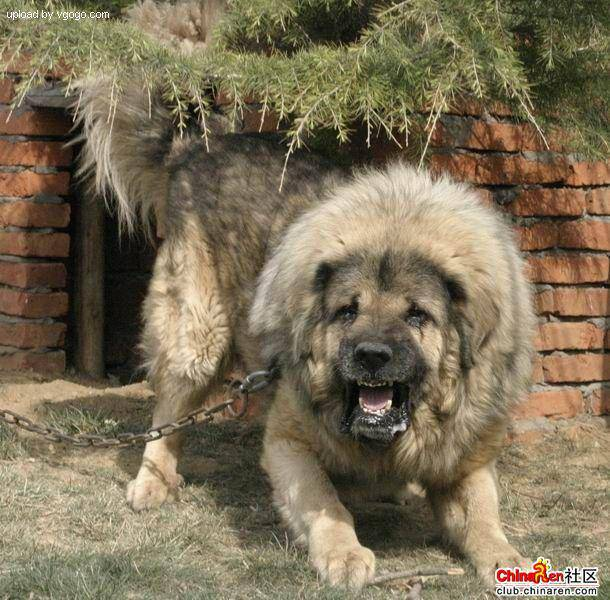

In [12]:
Image(filenames[9000])

In [13]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we have got our training image filepaths in a list, lets prepare our labels

In [14]:
import numpy as np
labels=labels_csv["breed"].to_numpy() #to convert to an array
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
#See if number of labels matches the number of filenames
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match no. of filenames, check data directories")

Number of labels matches number of filenames!


In [17]:
#find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [18]:
#turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
#turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]
#we have turned every labels as array of true and false

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #returns the index of the first True value.
print(boolean_labels[0].astype(int)) #there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation set
Since kaggle  dataset doesnt come with validation set, we are going to create our own

In [22]:
#Setup X and y variables
X=filenames
y=boolean_labels

In [23]:
len(X)

10222

We are going to start off with ~1000 images and increase as needed

In [24]:
#Set number of images to use for experimenting
NUM_IMAGES=1000 #@param{type:"slider",min:1000,max:10000,steps:1000}

In [25]:
#lets split aour data into train and validation sets
from sklearn.model_selection import train_test_split

np.random.seed(42)

#split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],
                                             y[:NUM_IMAGES],
                                             test_size=0.2)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [26]:
#lets have a geez at the training data
X_train[:5],y_train[:2]

(['/content/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, F

## Preprocessing images(turning images into tensors)
to precess our images into tensors we are going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save into a variable `image`
3. Turn out `image` (a jpg) into tensors
4. Normalize image (convert color channel values from 0-255 to 0-1).
4. Resize `image` to be a size id (224,224)
5. Return the modified `image`

Before we do, lets see what importing an image looks like.

In [27]:
#convert image into NumPy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [28]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [29]:
#turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we have seen what an image looks like as a tensor, lets make a function to preprocess them.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save itto a variable `iamge`
3. Turn out `image` (a jpg) into tensors
4. Normalize image (convert color channel values from 0-255 to 0-1).
5. Resize `image` to be a size id (224,224)
6. Return the modified `image`

In [30]:
#define image size
IMG_SIZE=224

#create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file and turns the image into a Tensor.
  """
  #Read in an image file
  image=tf.io.read_file(image_path)

  #turn the jpg image into numerical Tensor with 3 color channels(Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)

  #convert the color channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  #Resizing the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

 ## Turning out data into batches
 Why turn our data into batches?

 Lets say you are trying to process 10000+ images in one go... they all might not fit into memory.

 So, thats why we do 32 (this is batch size) images at a time (manually adjust batch size if needed).

 In order to use TensorFlow effectuvely, we need our data in the form of Tensor tuples which look like this: (`image`,`label`).

In [31]:
#create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a type of (image,label).
  """
  image=process_image(image_path)
  return image,label

In [32]:
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117759],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

**Now we have got a way to turn our data into tuples of tensors in the form: (image,labels), lets make a function to turn all of our data (X and y) into batches!**

In [33]:
# Define the batch size, 32 is a good start
BATCH_SIZE=32

#create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if its training data but doesnt shuffle if its a validation data.
  Also accepts test data as input(no labels).
  """
  #if the data is a test dataset, we dont have labels
  if test_data:
    print("creating test batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #if the data is a valid dataset. we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                             tf.constant(y))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #now train dataset
  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                            tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than
    data=data.shuffle(buffer_size=len(X))

    #create (image,label) tupels (this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    #turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)
    return data_batch

In [34]:
#create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [35]:
#check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec
#None here means 32 batch size.

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, lets visualize them!

In [36]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  displays a plot of 25 images and their labels from a data batch.
  """
  #setup the figure
  plt.figure(figsize=(10,10))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots (5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    #display an image
    plt.imshow(images[i])
    #Add the images label as title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [37]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [38]:
#as the datas are in batches we meed to debatch them
train_images,train_labels=next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          ...,
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7176471 , 0.854902  , 0.94117653]],
 
         [[0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          ...,
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7176471 , 0.854902  , 0.94117653]],
 
         [[0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          [0.7176471 , 0.85098046, 0.9490197 ],
          ...,
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7254902 , 0.85098046, 0.94117653],
          [0.7176471 , 0.854902  , 0.94117653]],
 
         ...,
 
         [[0.3658197 , 0.46237266, 0.15539074],
          [0.39499

In [39]:
len(train_images),len(train_labels)

(32, 32)

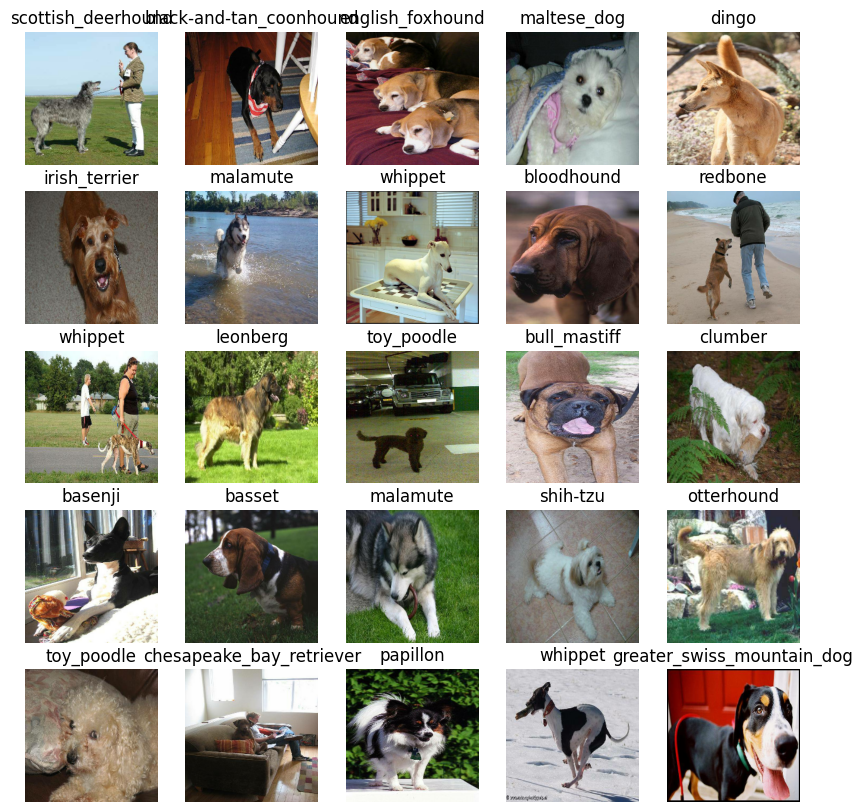

In [40]:
#Now lets visualize the data in a training batch
show_25_images(train_images,train_labels)
#each time we run images changes as we have shuffled the train dataset

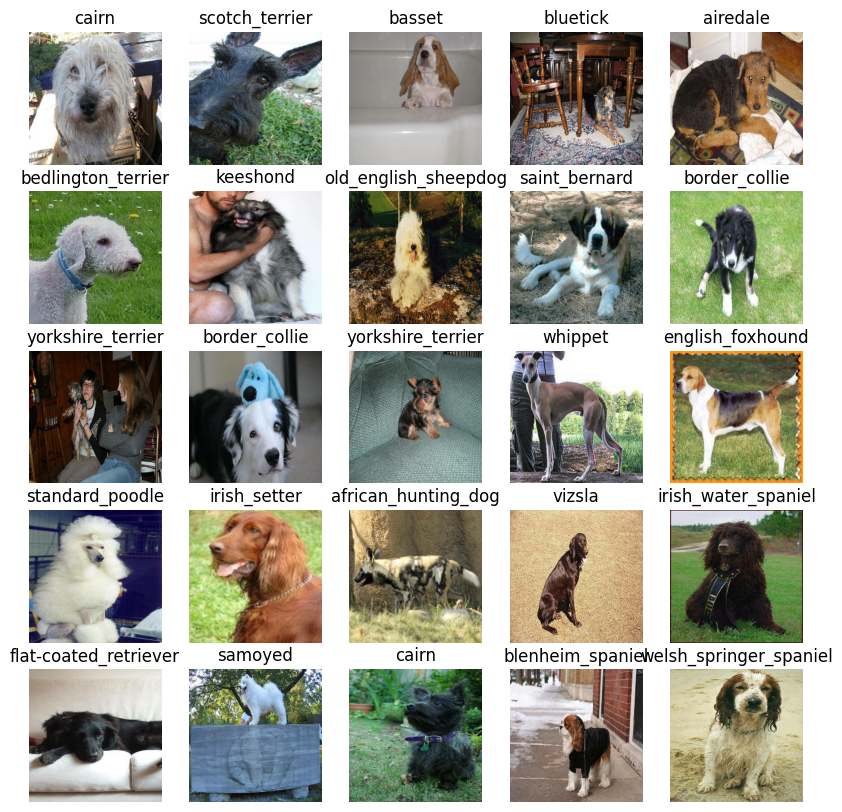

In [41]:
#now lets visualize our validation set
val_images,val_labels=next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)
#here images do not change as its not shuffled

## Building a model
Before we build a model, there are a few things we need to define:
* The input shape (our images shape, in the formof Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use form tensorflow hub - https://www.kaggle.com/models/google/mobilenet-v2/tensorFlow2/130-224-classification/1?tfhub-redirect=true


In [42]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

Now we have got inputs, outputs and model ready to go.
Lets put them togehter into a Keras deep learning model!

Knowing this, lets create a function which:
* Takes the input shape, output shape and the model we have chosen as parameters.
* Define the layers in a Keras model in sequential fashion.
* Complies the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

***Node:***

For Multi-class classification:
> Activation: softmax

> Loss: CategoricalCrossentropy

For Binary Classification:
> Activation: sigmoid

> Loss: BinaryCrossentropy

In [43]:
import tf_keras as keras

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
                          #after applying softmax each component qill be in (0,1) and the components will add upto 1.
  ])

  # Compile the model
  model.compile(
      loss=keras.losses.CategoricalCrossentropy(),
      optimizer=keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [44]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We will create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training too long.

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).

In [45]:
# load TensorBoard notebook extension
%load_ext tensorboard

import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #create a log directory for storing TensorBoard logs
  logdir=os.path.join("/content/drive/MyDrive/Machine Learning /dog vision/logs",
                      #Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return keras.callbacks.TensorBoard(logdir)

### Early stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [46]:
#Create early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

## Training a model (on subset of data)
Our first model is going to train on 1000 images, to make sure everything is working

In [47]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}

In [48]:
# Check to makesure we are still running on a GPU
print("GPU available" if tf.config.list_physical_devices("GPU") else "not available")

not available


Lets create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `craete_tensorboard_callback()`
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [49]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #create a model
  model=create_model()

  #create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #fit the model to the data passing it the callbacks we craeted
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model


In [50]:
#fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 52s 2s/step - loss: 4.6852 - accuracy: 0.0800 - val_loss: 3.6818 - val_accuracy: 0.1900
Epoch 2/100
25/25 [==============================] - 45s 2s/step - loss: 1.6606 - accuracy: 0.6775 - val_loss: 2.3826 - val_accuracy: 0.4250
Epoch 3/100
25/25 [==============================] - 45s 2s/step - loss: 0.5750 - accuracy: 0.9325 - val_loss: 1.8425 - val_accuracy: 0.5550
Epoch 4/100
25/25 [==============================] - 51s 2s/step - loss: 0.2526 - accuracy: 0.9887 - val_loss: 1.6533 - val_accuracy: 0.6050
Epoch 5/100
25/25 [==============================] - 46s 2s/step - loss: 0.1457 - accuracy: 0.9975 - val_loss: 1.5786 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 48s 2s/step - loss: 0.1012 - accuracy: 1.0000 - val_loss: 1.5173 - val_accuracy: 0.6100
Epoch 7/100
25/25 [==============================] - 49s 2s/s

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Ovefitting to begin with is a good thing! It means out model is learning!!

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [51]:
%tensorboard --logdir "/content/drive/MyDrive/Machine Learning /dog vision/logs"

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [52]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [53]:
#make predictions on validation data (not used to trained on)
predictions=model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 10s 1s/step


array([[3.9084088e-03, 3.8251434e-05, 1.2560806e-03, ..., 3.1136299e-04,
        3.0031253e-05, 3.6005005e-03],
       [8.1926547e-03, 1.4894812e-03, 4.7000945e-02, ..., 1.5015486e-03,
        1.1923056e-03, 1.0564275e-04],
       [3.7608197e-06, 2.6689133e-05, 2.6898088e-06, ..., 2.3352665e-04,
        2.4021239e-05, 5.8103498e-05],
       ...,
       [1.6831806e-05, 9.3199975e-05, 3.4145978e-05, ..., 3.8651760e-06,
        1.0517100e-04, 2.7595957e-05],
       [2.8867798e-03, 1.7273467e-04, 1.2957626e-04, ..., 1.0320805e-04,
        3.3463508e-05, 3.2971925e-03],
       [6.4926810e-04, 4.4763961e-05, 7.3704228e-04, ..., 6.8748235e-03,
        2.2198657e-04, 4.9834143e-05]], dtype=float32)

In [54]:
np.sum(predictions[0]),np.sum(predictions[1])

(np.float32(1.0), np.float32(1.0))

In [55]:
predictions.shape

(200, 120)

In [56]:
len(y_val),len(unique_breeds)

(200, 120)

In [57]:
# First prediction
index=0
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[3.90840881e-03 3.82514336e-05 1.25608058e-03 5.42227644e-05
 2.86339491e-04 9.86941304e-05 1.16181811e-02 4.40129574e-04
 8.84277280e-04 7.52229069e-04 1.11497196e-04 3.75797936e-05
 9.19983067e-05 2.10746439e-05 1.49300220e-04 3.36748257e-04
 6.94335031e-05 4.64904338e-01 7.98464316e-06 3.96615978e-05
 1.72783900e-03 1.69742532e-04 7.24865913e-06 2.15838826e-03
 4.15661889e-05 5.67717245e-04 7.51810744e-02 2.00239665e-04
 1.21732173e-03 6.09204988e-04 6.85197519e-05 2.82825466e-04
 1.78788358e-03 2.73057722e-05 2.12518498e-05 5.22419550e-02
 7.97267330e-06 9.71802365e-05 2.47272637e-05 1.02672646e-04
 8.90332682e-04 1.08123590e-04 4.91594838e-04 1.43911137e-04
 1.16807005e-05 9.98245669e-05 2.55223276e-04 8.82495879e-05
 5.65398776e-04 4.52524800e-05 3.21889500e-04 4.93558910e-05
 4.41242068e-04 3.97210475e-04 1.42437333e-04 1.36140043e-05
 3.25995497e-04 1.67082646e-03 9.42759158e-04 1.13335520e-01
 3.50382266e-04 1.82088741e-04 1.03255722e-03 5.77165883e-05
 2.48913217e-04 2.209308

In [58]:
unique_breeds[17]

'border_terrier'

Having the above functionality is great but we want to do it at scale.

And it would be even better if we could see image of the prediction is being on.

**Note:** Prediction probabilities are also known as confidence levels

In [59]:
#turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of predictions into label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

#get a predcited label based on an array of prediction probabilties
pred_label=get_pred_label(predictions[0])
pred_label

'border_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [60]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Take a batched dataset of (image ,label) Tendors and returns separate arrays of
  images and labels/
  """
  images=[]
  labels=[]
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation data
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [62]:
get_pred_label(val_labels[0])

'affenpinscher'

In [63]:
get_pred_label(predictions[0])

'border_terrier'

Now we have got ways to get:
* prediction labels
* Validation labels (truth labels)
* Validation Images

Lets make some function to make these all a bit more visualize.

We'll create a function which:
* Take an array of predictions probabilities, an array of truth labels and an array of images and integers.
* Convert the prediction probabilities to a predicted level.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [64]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  view the prediction, ground truth and image for sample n
  """

  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  #get th epred label
  pred_label=get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #change the color of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #change plot title ot be
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


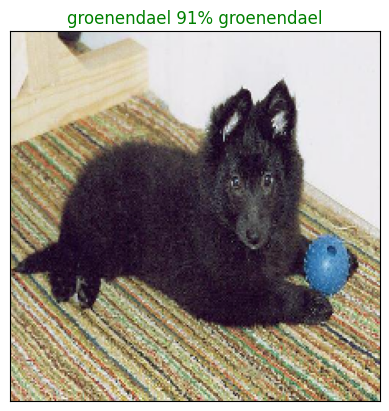

In [65]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we have got one function to visualize our models top prediction, lets make another to view our models top 10 predictions:

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green

In [66]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]
  #get the prediced label
  pred_label=get_pred_label(pred_prob)

  #find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #find the top 10  prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #find the top 10 prediciton labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #setup plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

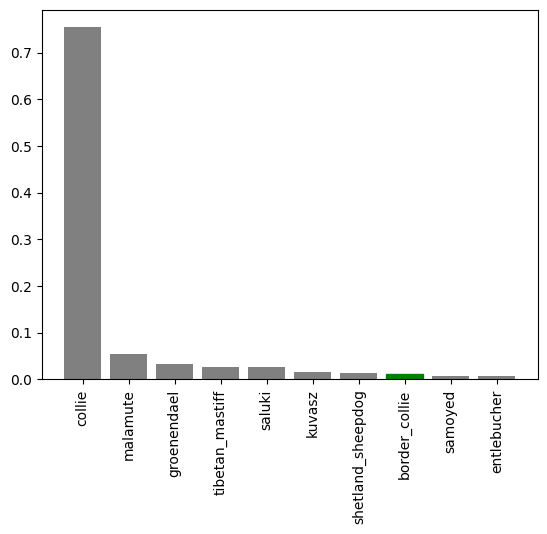

In [67]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we have got some functions to help us predictions and evaluate our model, lets check out a few.

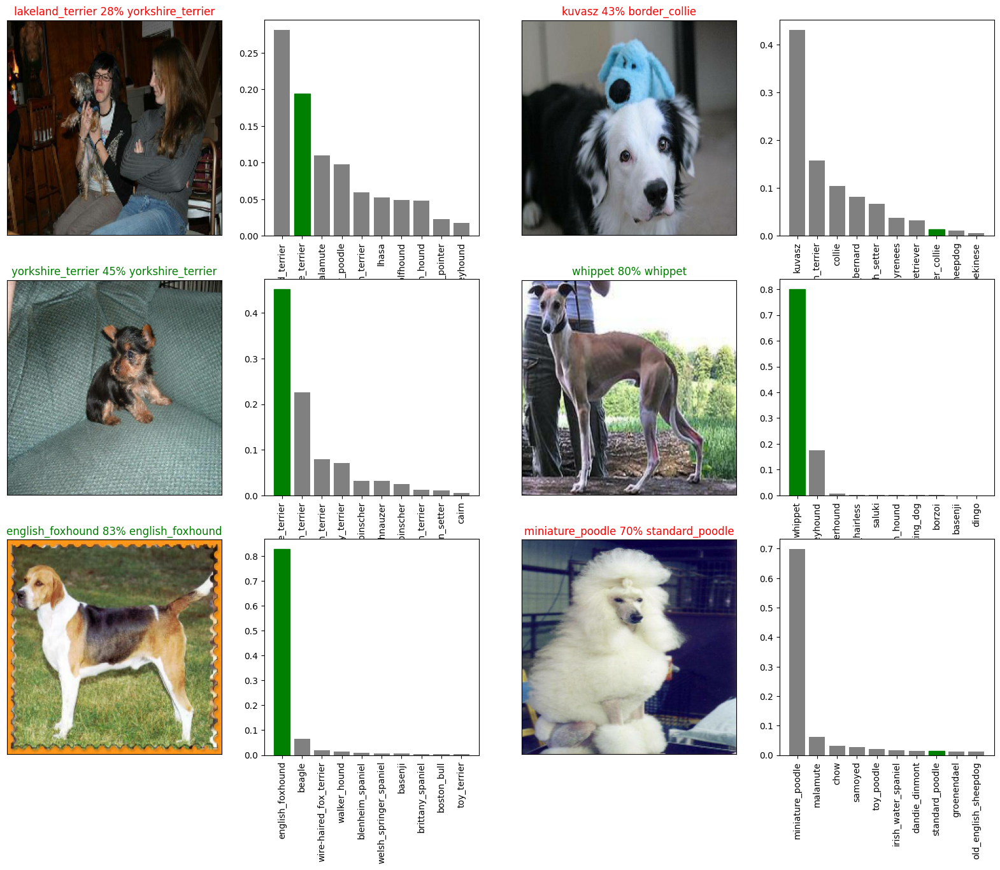

In [68]:
# Lets check out a few predictions and their different values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
# plt.tight_layout(h_pad=0.1)
plt.show()

**Challenge:** Create a confusion matrix with models predictions and true labels.

## Saving and reloading a trained model

In [69]:
# Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  #create a model directory pathname with current time
  modeldir=os.path.join("/content/drive/MyDrive/Machine Learning /dog vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir+"_"+suffix+".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [86]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model=keras.models.load_model(model_path,
                                custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we have functions to save and load a trained model, lets make sure they work!

In [71]:
#save our model trained on 1000 images
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Machine Learning /dog vision/models/20250604-13271749043678_1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Machine Learning /dog vision/models/20250604-13271749043678_1000-images-mobilenetv2-Adam.h5'

In [72]:
# load a trained model
loaded_1000_images_model=load_model("/content/drive/MyDrive/Machine Learning /dog vision/models/20250604-07501749023434_1000-images-mobilenetv2-Adam.h5")

In [73]:
# Evaluate the pre-save model
model.evaluate(val_data)

7/7 [==============================] - 9s 1s/step - loss: 1.3546 - accuracy: 0.6650


[1.3546408414840698, 0.6650000214576721]

In [74]:
#evaluate the loaded model
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 10s 1s/step - loss: 1.3176 - accuracy: 0.6750


[1.317612886428833, 0.675000011920929]

## Training a big dog model on full data

In [75]:
len(X),len(y)

(10222, 10222)

In [76]:
len(X_train) #our model was only trained on 800 images

800

In [77]:
#create a batch with the full dataset
full_data=create_data_batches(X,y)

Creating training data batches...


In [78]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
#create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [80]:
#create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#no validation set when training on all the data, so we cant monitor validation accuracy
full_model_early_stopping=keras.callbacks.EarlyStopping(monitor="accuracy",
                                                        patience=3)


**COMMENTING BELOW CODE  AS WE HAVE ALREADY SAVED IT**

In [81]:
# #Fit the full model to full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard,full_model_early_stopping])

In [82]:
#saving so that no need to run the above long process again...
# save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

In [87]:
#load the full model
loaded_full_model=load_model("/content/drive/MyDrive/Machine Learning /dog vision/models/20250604-10171749032236_full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: /content/drive/MyDrive/Machine Learning /dog vision/models/20250604-10171749032236_full-image-set-mobilenetv2-Adam.h5


## Making predicitons on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions in the test data, we'll have to get it into the same format.

To make predictions on the test data, we'll:
* Get test images filenames.
* To convert the filenames into test data batches using `create_date_batches()` and seting the `test_data` parmameter to True (since the test data doesnt have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [88]:
#load test image filenames
test_path="/content/test/"
test_filenames=[test_path+fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/test/7bc41bb3eb0fe1b77ba8cca37cad1819.jpg',
 '/content/test/be0547479d3ace1b57f0cc79fd607b4f.jpg',
 '/content/test/1cb39487e071702fb2ac1a31be2d31d7.jpg',
 '/content/test/e6b2cfafb8c0a06c062832369365fa9e.jpg',
 '/content/test/afefb423e2d89a88ffada2430606d999.jpg',
 '/content/test/59d79ad1feac9d2f5fd5d19c2fb7e999.jpg',
 '/content/test/9ecaa9a16c74f6e818188b95785eab6b.jpg',
 '/content/test/84e31f1e527a9be7e3e3a1a4e6962b95.jpg',
 '/content/test/0464d087e3f88c601758bd46acfb38a8.jpg',
 '/content/test/db5e3239ade5b5a86cca91ad3efc1298.jpg']

In [89]:
len(test_filenames)

10357

In [90]:
#create test data batch
test_data=create_data_batches(test_filenames,test_data=True)

creating test batches...


In [91]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data atch will take a long time to run (about an hour).

verbose values and their meaning:

verbose=0 → No output (silent mode).

verbose=1 → Progress bar is displayed (like what you see during training).

verbose=2 → One line per batch is printed (more detailed).



🟢 SAVED (thats why commented)

In [92]:
# # Make predicitons on test data batch using the loaded full model
# test_predictions=loaded_full_model.predict(test_data,
#                                            verbose=1)
# #showing 324 as 10357/3=~324

293/324 [==========================>...] - ETA: 47s

KeyboardInterrupt: 

In [ ]:
# #Save predictions (NumPy array) to csv file (for access later) so we dont need to run the above long process again
# np.savetxt("/content/drive/MyDrive/Machine Learning /dog vision/preds_array.csv",test_predictions,delimiter=",")

In [93]:
#load predictions (NumPy array) from csv file
test_predictions=np.loadtxt("/content/drive/MyDrive/Machine Learning /dog vision/preds_array.csv",delimiter=",")

In [94]:
test_predictions[:10]

array([[1.10097506e-06, 1.10552800e-11, 2.13976753e-10, ...,
        2.27690848e-12, 1.74500220e-10, 5.35820144e-09],
       [1.23041855e-06, 1.79394410e-09, 1.08178817e-07, ...,
        1.03142783e-09, 2.09368113e-06, 9.76302266e-01],
       [2.76323053e-09, 2.79093665e-10, 1.81938062e-10, ...,
        3.56455665e-08, 6.10437034e-09, 1.08595431e-10],
       ...,
       [3.41638329e-10, 5.58200703e-08, 6.08725204e-09, ...,
        1.18768810e-06, 1.07787945e-09, 6.70862671e-11],
       [3.84390294e-14, 1.10991672e-15, 2.63798748e-13, ...,
        1.43519238e-10, 5.70900488e-12, 7.81492872e-13],
       [6.13682621e-14, 6.92115492e-15, 1.20372614e-15, ...,
        7.08262729e-18, 1.54889091e-15, 7.56954297e-15]])

## Preparing test dataset predictions for kaggle
Looking at the kaggle sample submissions, we find that it wants our models prediction probability in a Dataframe with an id and a column for each different dog breed: www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.


In [95]:
#Create a pandas DataFrame with empty columns
import pandas as pd
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [103]:
#append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [104]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,7bc41bb3eb0fe1b77ba8cca37cad1819,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,be0547479d3ace1b57f0cc79fd607b4f,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1cb39487e071702fb2ac1a31be2d31d7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6b2cfafb8c0a06c062832369365fa9e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,afefb423e2d89a88ffada2430606d999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
#add the predition probabilities to each dog breed column
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,7bc41bb3eb0fe1b77ba8cca37cad1819,1.100975e-06,1.105528e-11,2.139768e-10,8.758075e-10,3.426641e-12,1.874335e-12,5.768756e-12,7.093657e-13,7.843767e-15,...,4.394629e-11,1.602726e-09,1.056811e-11,2.789285e-12,3.605445e-13,1.959217e-11,3.108520e-13,2.276908e-12,1.745002e-10,5.358201e-09
1,be0547479d3ace1b57f0cc79fd607b4f,1.230419e-06,1.793944e-09,1.081788e-07,4.125609e-07,1.069177e-07,2.648634e-09,2.970600e-04,3.443322e-08,4.254180e-09,...,1.580150e-07,7.310927e-06,2.700925e-07,7.728608e-09,9.505498e-09,2.422185e-08,6.631697e-08,1.031428e-09,2.093681e-06,9.763023e-01
2,1cb39487e071702fb2ac1a31be2d31d7,2.763231e-09,2.790937e-10,1.819381e-10,2.690974e-10,1.717024e-05,6.411576e-03,1.267285e-09,8.370636e-06,4.564928e-10,...,2.407051e-08,9.677081e-11,2.583377e-10,3.687070e-08,1.264197e-09,6.664555e-07,9.443851e-10,3.564557e-08,6.104370e-09,1.085954e-10
3,e6b2cfafb8c0a06c062832369365fa9e,1.989405e-14,7.552573e-15,3.682054e-14,1.946090e-12,1.371304e-09,6.118361e-11,1.015839e-17,1.374360e-16,1.517777e-12,...,4.855419e-14,1.199196e-15,5.913608e-10,4.014708e-15,9.999881e-01,1.071352e-12,4.387597e-16,2.077603e-10,1.774126e-12,3.830765e-12
4,afefb423e2d89a88ffada2430606d999,5.190765e-11,1.162789e-08,3.661118e-13,1.675330e-06,5.305364e-07,6.339171e-06,1.989332e-08,4.893201e-11,1.565967e-07,...,3.362626e-08,1.379051e-07,4.461159e-08,3.376670e-08,6.860592e-09,1.275608e-08,1.482626e-09,1.421884e-10,1.356063e-09,9.425329e-11


In [107]:
#save our predicitons DataFrame to csv for submission to Kaggle
preds_df.to_csv("/content/drive/MyDrive/Machine Learning /dog vision/full_moddel_predictions_submission_1_mobilenetv2.csv",
                index=False)

## Making predicitons on custom images
To make predictions on custom images, we'll:
* Get the filepaths of out own images.
* turn the filepaths into data batches using `create_data_batches()`.
* Pass the custom images data batch to our model's `predict()` method.
* convert the prediction  output probabilities to prediction labels
* Compare the predicted labels to custom images.

In [109]:
# Get custom image filepaths
custom_path="/content/drive/MyDrive/Machine Learning /dog vision/custom dog photos/"
custom_image_paths=[custom_path+fname for fname in os.listdir(custom_path)]

In [110]:
custom_image_paths

['/content/drive/MyDrive/Machine Learning /dog vision/custom dog photos/joe-caione-qO-PIF84Vxg-unsplash.jpg',
 '/content/drive/MyDrive/Machine Learning /dog vision/custom dog photos/oscar-sutton-yihlaRCCvd4-unsplash.jpg']

In [111]:
#turn custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

creating test batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [113]:
#make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [114]:
custom_preds.shape

(2, 120)

In [115]:
#get custom image predictions labels
custom_pred_labels=[get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['lakeland_terrier', 'sussex_spaniel']

In [116]:
#Get custom images (out unbatchify() function wont work since there arent labels...)
custom_images=[]
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

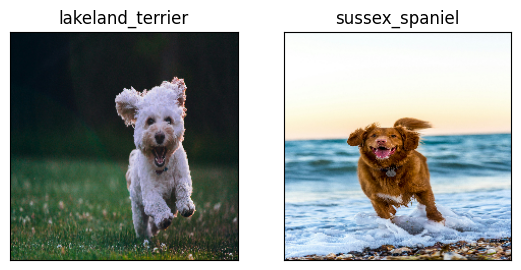

In [119]:
#check custom predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)